# Importing the libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import scipy.stats as stats
%matplotlib inline

## Reading the dataset

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
df = pd.read_csv("hw1_dataset.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Columns: 552 entries, experimental_proprty to n6Ring
dtypes: float64(444), int64(105), object(3)
memory usage: 8.4+ MB


In [3]:
for i in df.columns:
    if df[i].isna().sum()!=0:
        print(i,df[i].isna().sum())
df.describe()

MW2 100


,experimental_proprty,nHetero,nX,C2SP3,MPC5,ATS0i,NaasN,SsCH3,nCl,nFAHRing,SlogP_VSA6,AATS3d,ATSC6are,nHBDon,SddssS,ATS6m,nAcid,PEOE_VSA8,SsssCH,ATSC5dv,MPC9,SsBr,MPC4,AATS5v,ZMIC1,C2SP2,ATSC8v,MW2,MIC5,SMR_VSA2,nBondsA,Xp-7d,ATS8Z,nBondsKD,ATS1dv,SaasN,PEOE_VSA6,LabuteASA,AATS5pe,ATS3pe,n9FaRing,SssS,ATS0se,MPC7,AATSC5m,EState_VSA6,SRW04,SRW03,AATS5i,n5HRing,NaaN,AATS1Z,Sse,ATSC3d,AATS5d,VSA_EState1,IC2,SRW10,Xp-3dv,AATS5Z,ATS7pe,ATSC6pe,Xpc-5dv,bpol,ATSC0d,n10FaHRing,CIC1,ATSC1i,AATSC0dv,ATS4pe,ATS0are,nBondsS,ATSC6Z,ATS0v,ATS2d,ATS8pe,nF,ATS5i,ATS4m,ATS1se,MWC07,EState_VSA2,ATSC4d,ATSC3i,ATSC4p,Xp-6d,piPC5,ATS1are,AATS4m,IC4,NaaNH,WPol,NsCl,ATS0m,ATSC1pe,VSA_EState9,SdNH,AATSC0Z,ATS0pe,AATSC5Z,nBondsKS,SMR_VSA9,ATS3m,nBonds,ATSC8dv,MIF4,VSA_EState4,PEOE_VSA13,Xp-3d,ATS2se,SlogP_VSA10,ATSC6v,ATSC2i,ATS2are,n6aRing,AATS2Z,PEOE_VSA11,MWC03,AATSC3m,nFRing,TIC3,nO,ATSC7pe,ATS4v,AATSC1v,SRW05,EState_VSA8,Xpc-5d,NssssC,Sv,SRW06,ATSC4m,AATSC5dv,C1SP3,ATS8m,ATSC4Z,Sp,SdO,nHRing,ABCGG,NtsC,ATS1m,EState_VSA9,AATSC5v,nH,ATS7m,IC3,ATSC5se,ATS4d,AATSC4m,TIC5,ATS1p,MPC6,SlogP_VSA11,Diameter,GGI1,Xp-0dv,AATS2i,VMcGowan,ATSC3v,AATS0m,ATS1pe,ATS7are,ATS0Z,EState_VSA4,NaaaC,MWC05,n10FHRing,ATSC7p,AATS3Z,ATSC7se,TIC0,CIC2,ATSC0pe,VSA_EState5,SssO,ATS7dv,SaaO,SRW07,ATS5m,ATSC2Z,ATSC4dv,n9FHRing,AATSC4dv,n5aRing,SlogP_VSA1,MIF6,VSA_EState3,Xp-2dv,MIC4,Xp-4dv,fragCpx,TSRW10,GGI2,SRW08,piPC9,NssCH2,SZ,ATS7i,Si,ATSC4are,Zagreb1,ATSC3pe,SsssN,ATS2Z,NssNH,ATS2pe,ATS5v,AATS1m,ZMIC4,ATSC0p,AATS4d,ATS5pe,ATSC5v,PEOE_VSA5,AATS3m,mZagreb2,AATSC1m,n5Ring,ATSC1m,MIC1,ATSC8m,SMR_VSA4,AATSC2Z,n10FaRing,ATSC3Z,SdssC,SlogP_VSA7,EState_VSA1,AATS4i,SRW09,ATSC4i,ATSC1Z,Xpc-6d,AATS3i,ATS3v,VSA_EState8,ATS8se,ATSC2p,EState_VSA3,GGI4,ATSC1dv,ATS3se,ATSC8p,ATS8v,AATSC4v,ATSC6dv,ATSC5Z,SssNH,MWC06,nHeavyAtom,ATS6are,ATS3p,ECIndex,Xp-5d,MWC10,StsC,AATSC1Z,SMR_VSA3,piPC8,FilterItLogS,nBase,ATSC8se,nC,GGI3,TopoPSA(NO),ATSC5pe,NssO,ATS8d,piPC3,nRing,NsNH2,AATS3v,Kier3,ZMIC3,AATSC0m,ATSC8are,SlogP_VSA2,SMR_VSA5,AATS1dv,Xpc-4dv,n5aHRing,NsssN,Kier2,ATS4p,NaaS,AATS4Z,MIF2,ATS6se,ATS1v,MPC2,SMR_VSA7,SaaNH,SaaCH,AATSC3v,ATSC5are,ATS2v,AATSC4Z,ZMIC2,ATS5are,ATS6d,ATS7v,ATSC6i,ATSC2d,SlogP_VSA8,PEOE_VSA1,nN,ATS3d,VSA_EState6,ATSC4v,IC5,SsOH,nHBAcc,AATS4are,piPC6,SsF,MW,ATS4are,ATSC3p,NdO,n5AHRing,BertzCT,AATS1d,nAromBond,TMWC10,ATS8are,n9FaHRing,ATS8dv,Xp-1dv,SdsN,nBridgehead,AATS2d,AATS4v,naRing,ATSC1d,ATS2p,ATSC1v,ATSC0dv,AATSC3dv,NddssS,ATS7Z,ATS6i,TIC4,AATSC3Z,ATS1i,Sm,VAdjMat,ATS7se,AATS0v,nAHRing,SlogP_VSA5,Xc-3dv,AATS3dv,GGI6,ATS2m,ATSC7d,ATSC7dv,NsCH3,n5ARing,ATSC8pe,NsF,BalabanJ,PEOE_VSA2,naHRing,MIF3,ATS4i,ATSC2dv,AATS4dv,nFaRing,SMR,AMW,ATS8i,CIC0,nFaHRing,ABC,AATS2m,ATS6dv,MIC2,ATSC7are,ATS8p,TopoPSA,ATSC5i,Xp-1d,MWC01,Kier1,AATSC0i,ATSC3se,Xp-5dv,Sare,ATSC6m,ZMIC5,AATS1i,nAromAtom,PEOE_VSA3,ATSC0Z,ZMIC0,ATS5Z,Xc-3d,ATS3Z,MIF5,SssCH2,n6aHRing,ATSC0i,MWC08,n10FRing,SaaS,Spe,ATS0dv,Zagreb2,SlogP_VSA3,NdsCH,MWC09,ATSC1p,ATSC6p,ATSC3m,NaasC,ATS4Z,ATS0p,Radius,n6HRing,nARing,PEOE_VSA9,piPC10,ATSC2m,SssssC,NaaCH,C3SP3,EState_VSA7,ATS3dv,MPC3,ATS5p,SLogP,ATSC0se,ATSC7Z,n6AHRing,SaaaC,ATS5d,MIC0,PEOE_VSA7,nRot,StCH,ATSC2v,EState_VSA10,AATS0are,ATSC7m,AATS0i,ATS7p,nBondsD,nFHRing,ATSC1are,SMR_VSA1,TIC1,Xp-4d,nAtom,ATSC3dv,C3SP2,ATS6Z,n6ARing,MPC8,ATSC4se,NsOH,Xpc-4d,SsNH2,ATSC0v,SMR_VSA6,piPC7,Xp-6dv,PEOE_VSA4,ATS6p,apol,ATSC2se,AATSC0v,ATSC3are,StN,ATS1d,ATS2i,ATSC4pe,ATSC5p,ATS2dv,AATS5m,nS,piPC4,ATSC5m,ATS7d,AATS1v,AATS0pe,AATS2dv,VSA_EState2,ATSC0m,ATS3are,ATSC8Z,ATS3i,ATS1Z,ATSC7v,ATSC8i,ATSC5d,PEOE_VSA10,ATSC7i,Xp-2d,AATS0dv,nBondsO,AATS5dv,TIC2,GGI5,AATSC2dv,TMPC10,AATSC2m,MWC04,n9FRing,Xc-5d,ATSC8d,MIC3,VSA_EState7,NdssC,TpiPC10,C1SP2,nBondsM,SaasC,WPath,ATS6pe,ATSC2are,AATS5are,ATS4dv,SlogP_VSA4,SdsCH,MPC10,ATSC6d,ATS5dv,ATS5se,NsssCH,ATSC6se,AATSC2v,PEOE_VSA12,IC1,SaaN,ATS4se,Xpc-6dv,EState_VSA5,ATS0d,AATS0Z,ATSC0are,ATSC2pe,SsCl,ATS6v,AATSC1dv,nFARing,AATS2v,Xp-7dv,n6Ring
count,2000.000000,2000.00000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.0

In [4]:
string_columns = df.select_dtypes(include='object').columns
string_columns

Index(['MS_enc', 'MIF', 'SMIF'], dtype='object')

From viewing the dataset we can conclude that the columns MS_enc and SMIF are the only ones that actually have data types of string with the MIF column having only certain values being a string with values "Computation Failed"

In [5]:
df.MW2.fillna(value= df['MW2'].mean(), inplace=True)
for i in df.columns:
    if df[i].isna().sum()!=0:
        print(i,df[i].isna().sum())

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_16724\2817544751.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df.MW2.fillna(value= df['MW2'].mean(), inplace=True)


In [6]:
for i in string_columns:
    print(df[i].unique())

['PPENPINEAPLE42' 'HTXPTDWTTWOBJR' 'GOMNOOKGLZYEJT' 'RCRMUKSWQWDMNL'
 'BOTNYLSAWDQNEX' 'ZUOUZKKEUPVFJK' 'GALNGAIOIHBIMC' 'IGCQXMQOKRXHHN'
 'PBKBKIZZTQGPNF' 'HMOUISRYHLEUNP' 'NRTUTGBOQZQBMB' 'BAXOFTOLAUCFNW'
 'NEEMPYCQFCVGIU' 'WKEHRSGEQPYYPS' 'RFJPGRQJVLXFBM' 'RTVJPISFXFDDFU'
 'FXSUMCOIAGFLPN' 'UYYKSGIDWWMCHC' 'NXYOGONNLGHJLI' 'DSAYTZOSLVGXMN'
 'JBKDDNGUOPDBIN' 'UHOVQNZJYSORNB' 'ZVSKZLHKADLHSD' 'VHEGBLPHXSCODD'
 'UGYJQWOEXDFOBE' 'DBDVAKGHPZJLTH' 'ZLUIDXRFWSPPCC' 'WFGFEOLNELJISV'
 'JHAGKBVBZDYISA' 'IOJUPLGTWVMSFF' 'VFVXVRPTRGHSHB' 'JYTRDJFJTLMAHG'
 'YYVYAPXYZVYDHN' 'GCRYKXLRCQDDAD' 'FGDGJJNJEUYMFK' 'NBWZTGIODNJYRQ'
 'FBNDAUIIDREEIK' 'SMWDFEZZVXVKRB' 'FSEXLNMNADBYJU' 'VMZXVMIGMRZLPU'
 'ZKZKYIVHVORTNZ' 'KCZQVDUNRPTDJR' 'MTSNDBYBIZSILH' 'FIVCRRVYLAXYFC'
 'YBHCYGZJSRSNRK' 'XAUGWFWQVYXATQ' 'XTUIDRJNCMLRAD' 'PTRTXJMGYGBMDT'
 'GKFFFOLFBJUEFN' 'SWUJGAXOMZUIRP' 'UFWIBTONFRDIAS']
['Computation failed' '59' '37' '46' '55' '44' '66' '39' '21' '51' '43'
 '19' '60' '27' '56' '57' '50' '64' '48' '58' '

In [7]:
df['MIF'] = df['MIF'].replace("Computation failed", 0)

In [8]:
df['MIF'].unique()

array([0, '59', '37', '46', '55', '44', '66', '39', '21', '51', '43',
       '19', '60', '27', '56', '57', '50', '64', '48', '58', '40', '31',
       '80', '54', '36', '53', '41', '63', '88', '29', '28', '47', '33',
       '34', '35', '49', '65', '15', '42', '62', '25', '61', '52', '69',
       '79', '84', '30', '18', '32', '45', '71', '24', '95', '89', '67',
       '72', '26', '38', '74', '103', '68', '14', '23', '83', '76', '20',
       '73', '92', '70', '134', '17', '16', '22', '75', '82', '78', '12',
       '77', '81', '120', '128', '203', '86', '97', '85'], dtype=object)

In [9]:
for i in string_columns:
    print(df[i].unique())

['PPENPINEAPLE42' 'HTXPTDWTTWOBJR' 'GOMNOOKGLZYEJT' 'RCRMUKSWQWDMNL'
 'BOTNYLSAWDQNEX' 'ZUOUZKKEUPVFJK' 'GALNGAIOIHBIMC' 'IGCQXMQOKRXHHN'
 'PBKBKIZZTQGPNF' 'HMOUISRYHLEUNP' 'NRTUTGBOQZQBMB' 'BAXOFTOLAUCFNW'
 'NEEMPYCQFCVGIU' 'WKEHRSGEQPYYPS' 'RFJPGRQJVLXFBM' 'RTVJPISFXFDDFU'
 'FXSUMCOIAGFLPN' 'UYYKSGIDWWMCHC' 'NXYOGONNLGHJLI' 'DSAYTZOSLVGXMN'
 'JBKDDNGUOPDBIN' 'UHOVQNZJYSORNB' 'ZVSKZLHKADLHSD' 'VHEGBLPHXSCODD'
 'UGYJQWOEXDFOBE' 'DBDVAKGHPZJLTH' 'ZLUIDXRFWSPPCC' 'WFGFEOLNELJISV'
 'JHAGKBVBZDYISA' 'IOJUPLGTWVMSFF' 'VFVXVRPTRGHSHB' 'JYTRDJFJTLMAHG'
 'YYVYAPXYZVYDHN' 'GCRYKXLRCQDDAD' 'FGDGJJNJEUYMFK' 'NBWZTGIODNJYRQ'
 'FBNDAUIIDREEIK' 'SMWDFEZZVXVKRB' 'FSEXLNMNADBYJU' 'VMZXVMIGMRZLPU'
 'ZKZKYIVHVORTNZ' 'KCZQVDUNRPTDJR' 'MTSNDBYBIZSILH' 'FIVCRRVYLAXYFC'
 'YBHCYGZJSRSNRK' 'XAUGWFWQVYXATQ' 'XTUIDRJNCMLRAD' 'PTRTXJMGYGBMDT'
 'GKFFFOLFBJUEFN' 'SWUJGAXOMZUIRP' 'UFWIBTONFRDIAS']
[0 '59' '37' '46' '55' '44' '66' '39' '21' '51' '43' '19' '60' '27' '56'
 '57' '50' '64' '48' '58' '40' '31' '80' '54' 

In [10]:
df['MIF'] = df['MIF'].astype(int)

In [11]:
df = df.fillna({
    'MIF': df['MIF'].mean()
})

In [12]:
df.describe()

,experimental_proprty,nHetero,nX,C2SP3,MPC5,ATS0i,NaasN,SsCH3,nCl,nFAHRing,SlogP_VSA6,AATS3d,ATSC6are,nHBDon,SddssS,ATS6m,nAcid,PEOE_VSA8,SsssCH,ATSC5dv,MPC9,SsBr,MPC4,AATS5v,ZMIC1,C2SP2,ATSC8v,MW2,MIC5,SMR_VSA2,nBondsA,Xp-7d,ATS8Z,nBondsKD,ATS1dv,SaasN,PEOE_VSA6,LabuteASA,AATS5pe,ATS3pe,n9FaRing,SssS,ATS0se,MPC7,AATSC5m,EState_VSA6,SRW04,SRW03,AATS5i,n5HRing,NaaN,AATS1Z,Sse,ATSC3d,AATS5d,VSA_EState1,IC2,SRW10,Xp-3dv,AATS5Z,ATS7pe,ATSC6pe,Xpc-5dv,bpol,ATSC0d,n10FaHRing,CIC1,ATSC1i,AATSC0dv,ATS4pe,ATS0are,nBondsS,ATSC6Z,ATS0v,ATS2d,ATS8pe,nF,ATS5i,ATS4m,ATS1se,MWC07,EState_VSA2,ATSC4d,ATSC3i,ATSC4p,Xp-6d,piPC5,ATS1are,AATS4m,IC4,NaaNH,WPol,MIF,NsCl,ATS0m,ATSC1pe,VSA_EState9,SdNH,AATSC0Z,ATS0pe,AATSC5Z,nBondsKS,SMR_VSA9,ATS3m,nBonds,ATSC8dv,MIF4,VSA_EState4,PEOE_VSA13,Xp-3d,ATS2se,SlogP_VSA10,ATSC6v,ATSC2i,ATS2are,n6aRing,AATS2Z,PEOE_VSA11,MWC03,AATSC3m,nFRing,TIC3,nO,ATSC7pe,ATS4v,AATSC1v,SRW05,EState_VSA8,Xpc-5d,NssssC,Sv,SRW06,ATSC4m,AATSC5dv,C1SP3,ATS8m,ATSC4Z,Sp,SdO,nHRing,ABCGG,NtsC,ATS1m,EState_VSA9,AATSC5v,nH,ATS7m,IC3,ATSC5se,ATS4d,AATSC4m,TIC5,ATS1p,MPC6,SlogP_VSA11,Diameter,GGI1,Xp-0dv,AATS2i,VMcGowan,ATSC3v,AATS0m,ATS1pe,ATS7are,ATS0Z,EState_VSA4,NaaaC,MWC05,n10FHRing,ATSC7p,AATS3Z,ATSC7se,TIC0,CIC2,ATSC0pe,VSA_EState5,SssO,ATS7dv,SaaO,SRW07,ATS5m,ATSC2Z,ATSC4dv,n9FHRing,AATSC4dv,n5aRing,SlogP_VSA1,MIF6,VSA_EState3,Xp-2dv,MIC4,Xp-4dv,fragCpx,TSRW10,GGI2,SRW08,piPC9,NssCH2,SZ,ATS7i,Si,ATSC4are,Zagreb1,ATSC3pe,SsssN,ATS2Z,NssNH,ATS2pe,ATS5v,AATS1m,ZMIC4,ATSC0p,AATS4d,ATS5pe,ATSC5v,PEOE_VSA5,AATS3m,mZagreb2,AATSC1m,n5Ring,ATSC1m,MIC1,ATSC8m,SMR_VSA4,AATSC2Z,n10FaRing,ATSC3Z,SdssC,SlogP_VSA7,EState_VSA1,AATS4i,SRW09,ATSC4i,ATSC1Z,Xpc-6d,AATS3i,ATS3v,VSA_EState8,ATS8se,ATSC2p,EState_VSA3,GGI4,ATSC1dv,ATS3se,ATSC8p,ATS8v,AATSC4v,ATSC6dv,ATSC5Z,SssNH,MWC06,nHeavyAtom,ATS6are,ATS3p,ECIndex,Xp-5d,MWC10,StsC,AATSC1Z,SMR_VSA3,piPC8,FilterItLogS,nBase,ATSC8se,nC,GGI3,TopoPSA(NO),ATSC5pe,NssO,ATS8d,piPC3,nRing,NsNH2,AATS3v,Kier3,ZMIC3,AATSC0m,ATSC8are,SlogP_VSA2,SMR_VSA5,AATS1dv,Xpc-4dv,n5aHRing,NsssN,Kier2,ATS4p,NaaS,AATS4Z,MIF2,ATS6se,ATS1v,MPC2,SMR_VSA7,SaaNH,SaaCH,AATSC3v,ATSC5are,ATS2v,AATSC4Z,ZMIC2,ATS5are,ATS6d,ATS7v,ATSC6i,ATSC2d,SlogP_VSA8,PEOE_VSA1,nN,ATS3d,VSA_EState6,ATSC4v,IC5,SsOH,nHBAcc,AATS4are,piPC6,SsF,MW,ATS4are,ATSC3p,NdO,n5AHRing,BertzCT,AATS1d,nAromBond,TMWC10,ATS8are,n9FaHRing,ATS8dv,Xp-1dv,SdsN,nBridgehead,AATS2d,AATS4v,naRing,ATSC1d,ATS2p,ATSC1v,ATSC0dv,AATSC3dv,NddssS,ATS7Z,ATS6i,TIC4,AATSC3Z,ATS1i,Sm,VAdjMat,ATS7se,AATS0v,nAHRing,SlogP_VSA5,Xc-3dv,AATS3dv,GGI6,ATS2m,ATSC7d,ATSC7dv,NsCH3,n5ARing,ATSC8pe,NsF,BalabanJ,PEOE_VSA2,naHRing,MIF3,ATS4i,ATSC2dv,AATS4dv,nFaRing,SMR,AMW,ATS8i,CIC0,nFaHRing,ABC,AATS2m,ATS6dv,MIC2,ATSC7are,ATS8p,TopoPSA,ATSC5i,Xp-1d,MWC01,Kier1,AATSC0i,ATSC3se,Xp-5dv,Sare,ATSC6m,ZMIC5,AATS1i,nAromAtom,PEOE_VSA3,ATSC0Z,ZMIC0,ATS5Z,Xc-3d,ATS3Z,MIF5,SssCH2,n6aHRing,ATSC0i,MWC08,n10FRing,SaaS,Spe,ATS0dv,Zagreb2,SlogP_VSA3,NdsCH,MWC09,ATSC1p,ATSC6p,ATSC3m,NaasC,ATS4Z,ATS0p,Radius,n6HRing,nARing,PEOE_VSA9,piPC10,ATSC2m,SssssC,NaaCH,C3SP3,EState_VSA7,ATS3dv,MPC3,ATS5p,SLogP,ATSC0se,ATSC7Z,n6AHRing,SaaaC,ATS5d,MIC0,PEOE_VSA7,nRot,StCH,ATSC2v,EState_VSA10,AATS0are,ATSC7m,AATS0i,ATS7p,nBondsD,nFHRing,ATSC1are,SMR_VSA1,TIC1,Xp-4d,nAtom,ATSC3dv,C3SP2,ATS6Z,n6ARing,MPC8,ATSC4se,NsOH,Xpc-4d,SsNH2,ATSC0v,SMR_VSA6,piPC7,Xp-6dv,PEOE_VSA4,ATS6p,apol,ATSC2se,AATSC0v,ATSC3are,StN,ATS1d,ATS2i,ATSC4pe,ATSC5p,ATS2dv,AATS5m,nS,piPC4,ATSC5m,ATS7d,AATS1v,AATS0pe,AATS2dv,VSA_EState2,ATSC0m,ATS3are,ATSC8Z,ATS3i,ATS1Z,ATSC7v,ATSC8i,ATSC5d,PEOE_VSA10,ATSC7i,Xp-2d,AATS0dv,nBondsO,AATS5dv,TIC2,GGI5,AATSC2dv,TMPC10,AATSC2m,MWC04,n9FRing,Xc-5d,ATSC8d,MIC3,VSA_EState7,NdssC,TpiPC10,C1SP2,nBondsM,SaasC,WPath,ATS6pe,ATSC2are,AATS5are,ATS4dv,SlogP_VSA4,SdsCH,MPC10,ATSC6d,ATS5dv,ATS5se,NsssCH,ATSC6se,AATSC2v,PEOE_VSA12,IC1,SaaN,ATS4se,Xpc-6dv,EState_VSA5,ATS0d,AATS0Z,ATSC0are,ATSC2pe,SsCl,ATS6v,AATSC1dv,nFARing,AATS2v,Xp-7dv,n6Ring
count,2000.000000,2000.00000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,20

In [13]:
enc = LabelEncoder()

In [14]:
X = ['HTXPTDWTTWOBJR', 'GOMNOOKGLZYEJT', 'RCRMUKSWQWDMNL', 'BOTNYLSAWDQNEX', 'ZUOUZKKEUPVFJK', 'GALNGAIOIHBIMC', 'IGCQXMQOKRXHHN', 'PBKBKIZZTQGPNF', 'HMOUISRYHLEUNP', 'NRTUTGBOQZQBMB', 'BAXOFTOLAUCFNW','NEEMPYCQFCVGIU', 'WKEHRSGEQPYYPS', 'RFJPGRQJVLXFBM', 'RTVJPISFXFDDFU','FXSUMCOIAGFLPN', 'UYYKSGIDWWMCHC', 'NXYOGONNLGHJLI','JBKDDNGUOPDBIN', 'UHOVQNZJYSORNB', 'ZVSKZLHKADLHSD', 'VHEGBLPHXSCODD','UGYJQWOEXDFOBE', 'DBDVAKGHPZJLTH', 'ZLUIDXRFWSPPCC', 'WFGFEOLNELJISV','JHAGKBVBZDYISA', 'IOJUPLGTWVMSFF', 'VFVXVRPTRGHSHB', 'JYTRDJFJTLMAHG', 'YYVYAPXYZVYDHN', 'GCRYKXLRCQDDAD', 'FGDGJJNJEUYMFK', 'NBWZTGIODNJYRQ','FBNDAUIIDREEIK', 'SMWDFEZZVXVKRB', 'FSEXLNMNADBYJU', 'VMZXVMIGMRZLPU', 'ZKZKYIVHVORTNZ', 'KCZQVDUNRPTDJR', 'MTSNDBYBIZSILH', 'FIVCRRVYLAXYFC','YBHCYGZJSRSNRK', 'XAUGWFWQVYXATQ', 'XTUIDRJNCMLRAD', 'PTRTXJMGYGBMDT','GKFFFOLFBJUEFN', 'SWUJGAXOMZUIRP', 'UFWIBTONFRDIAS', "DSAYTZOSLVGXMN"]

In [15]:
string_columns = df.select_dtypes(include='object').columns

In [16]:
df['MS_enc'].value_counts()

MS_enc
PPENPINEAPLE42    1569
UHOVQNZJYSORNB      41
RCRMUKSWQWDMNL      17
ZUOUZKKEUPVFJK      15
NRTUTGBOQZQBMB      13
VHEGBLPHXSCODD      13
GALNGAIOIHBIMC      13
VFVXVRPTRGHSHB      12
WFGFEOLNELJISV      12
GOMNOOKGLZYEJT      12
HMOUISRYHLEUNP      11
GCRYKXLRCQDDAD      11
YBHCYGZJSRSNRK      11
JYTRDJFJTLMAHG      10
JHAGKBVBZDYISA      10
BOTNYLSAWDQNEX      10
JBKDDNGUOPDBIN      10
YYVYAPXYZVYDHN       9
DSAYTZOSLVGXMN       9
IOJUPLGTWVMSFF       8
UGYJQWOEXDFOBE       8
NXYOGONNLGHJLI       8
GKFFFOLFBJUEFN       8
FIVCRRVYLAXYFC       8
NBWZTGIODNJYRQ       7
KCZQVDUNRPTDJR       7
MTSNDBYBIZSILH       7
SMWDFEZZVXVKRB       7
UFWIBTONFRDIAS       7
BAXOFTOLAUCFNW       6
UYYKSGIDWWMCHC       6
IGCQXMQOKRXHHN       6
FGDGJJNJEUYMFK       6
RFJPGRQJVLXFBM       6
FSEXLNMNADBYJU       6
VMZXVMIGMRZLPU       6
NEEMPYCQFCVGIU       6
ZLUIDXRFWSPPCC       5
SWUJGAXOMZUIRP       5
PTRTXJMGYGBMDT       5
XTUIDRJNCMLRAD       5
XAUGWFWQVYXATQ       5
PBKBKIZZTQGPNF       5
ZKZK

In [17]:
n =0
df.MS_enc = df.MS_enc.replace("PPENPINEAPLE42", 1)
for i in X:
    df.MS_enc =df.MS_enc.replace(i, 0)
df['MS_enc'].value_counts()

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_16724\2518162930.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df.MS_enc =df.MS_enc.replace(i, 0)


MS_enc
1    1569
0     431
Name: count, dtype: int64

In [18]:
string_columns = df.select_dtypes(include='object').columns
string_columns

Index(['SMIF'], dtype='object')

In [19]:
df.SMIF.value_counts()

SMIF
the_biggest    667
big            667
bigger         666
Name: count, dtype: int64

In [20]:
X = [['bigger'], ['the_biggest'], ['big']]
enc.fit_transform(X)

C:\Users\Lenovo\anaconda3\Lib\site-packages\sklearn\preprocessing\_label.py:114: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


array([1, 2, 0], dtype=int64)

In [21]:
df.SMIF = enc.transform(df.SMIF)
df.SMIF.value_counts()

SMIF
2    667
0    667
1    666
Name: count, dtype: int64

<Axes: >

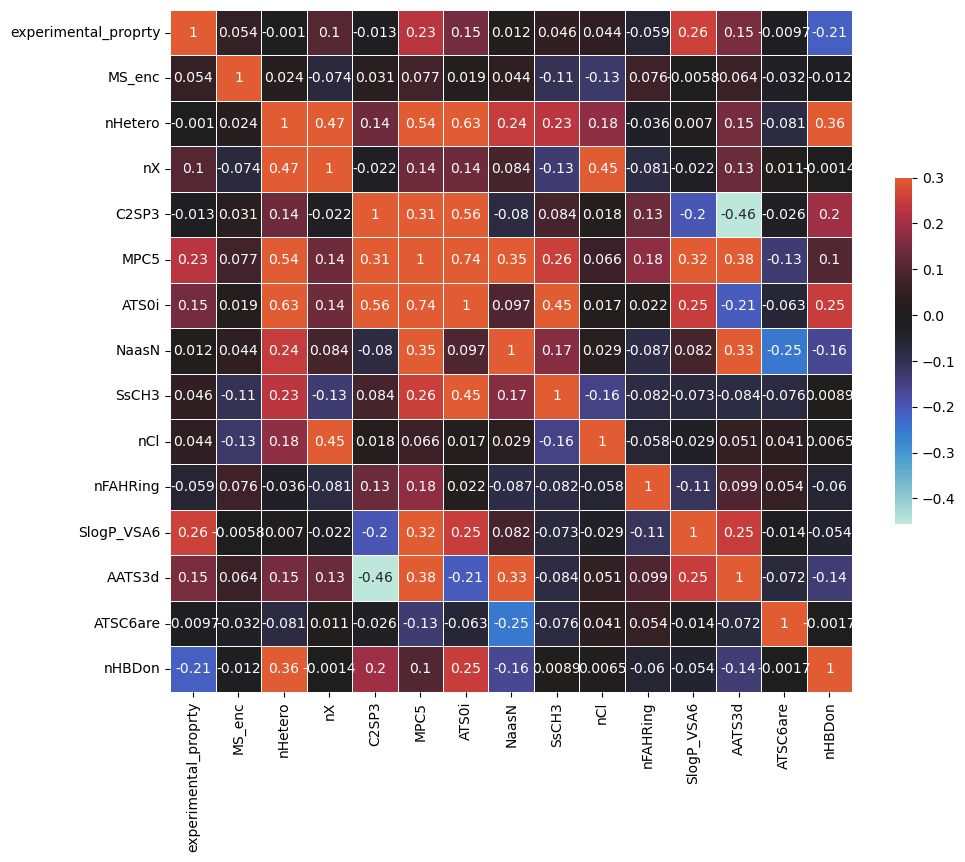

In [22]:
# Compute the correlation matrix
corr = df.iloc[:, :15].corr()

# Generate a mask for the upper triangle

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(130, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(df.iloc[:, :15].corr(), vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot = True)

In [23]:
corr = df.corr()
corr

,experimental_proprty,MS_enc,nHetero,nX,C2SP3,MPC5,ATS0i,NaasN,SsCH3,nCl,nFAHRing,SlogP_VSA6,AATS3d,ATSC6are,nHBDon,SddssS,ATS6m,nAcid,PEOE_VSA8,SsssCH,ATSC5dv,MPC9,SsBr,MPC4,AATS5v,ZMIC1,C2SP2,ATSC8v,MW2,MIC5,SMR_VSA2,nBondsA,Xp-7d,ATS8Z,nBondsKD,ATS1dv,SaasN,PEOE_VSA6,LabuteASA,AATS5pe,ATS3pe,n9FaRing,SssS,ATS0se,MPC7,AATSC5m,EState_VSA6,SRW04,SRW03,AATS5i,n5HRing,NaaN,AATS1Z,Sse,ATSC3d,AATS5d,VSA_EState1,IC2,SRW10,Xp-3dv,AATS5Z,ATS7pe,ATSC6pe,Xpc-5dv,bpol,ATSC0d,n10FaHRing,CIC1,ATSC1i,AATSC0dv,ATS4pe,ATS0are,nBondsS,ATSC6Z,ATS0v,ATS2d,ATS8pe,nF,ATS5i,ATS4m,ATS1se,MWC07,EState_VSA2,ATSC4d,ATSC3i,ATSC4p,Xp-6d,piPC5,ATS1are,AATS4m,IC4,NaaNH,WPol,MIF,NsCl,ATS0m,ATSC1pe,VSA_EState9,SdNH,AATSC0Z,ATS0pe,AATSC5Z,nBondsKS,SMR_VSA9,ATS3m,nBonds,ATSC8dv,MIF4,VSA_EState4,PEOE_VSA13,Xp-3d,ATS2se,SlogP_VSA10,ATSC6v,ATSC2i,ATS2are,n6aRing,AATS2Z,PEOE_VSA11,MWC03,AATSC3m,nFRing,TIC3,nO,ATSC7pe,ATS4v,AATSC1v,SRW05,EState_VSA8,Xpc-5d,NssssC,Sv,SRW06,ATSC4m,AATSC5dv,C1SP3,ATS8m,ATSC4Z,Sp,SdO,nHRing,ABCGG,NtsC,ATS1m,EState_VSA9,AATSC5v,nH,ATS7m,IC3,ATSC5se,ATS4d,AATSC4m,TIC5,ATS1p,MPC6,SlogP_VSA11,Diameter,GGI1,Xp-0dv,AATS2i,VMcGowan,ATSC3v,AATS0m,ATS1pe,ATS7are,ATS0Z,EState_VSA4,NaaaC,MWC05,n10FHRing,ATSC7p,AATS3Z,ATSC7se,TIC0,CIC2,ATSC0pe,VSA_EState5,SssO,ATS7dv,SaaO,SRW07,ATS5m,ATSC2Z,ATSC4dv,n9FHRing,AATSC4dv,n5aRing,SlogP_VSA1,MIF6,VSA_EState3,Xp-2dv,MIC4,Xp-4dv,fragCpx,TSRW10,GGI2,SRW08,SMIF,piPC9,NssCH2,SZ,ATS7i,Si,ATSC4are,Zagreb1,ATSC3pe,SsssN,ATS2Z,NssNH,ATS2pe,ATS5v,AATS1m,ZMIC4,ATSC0p,AATS4d,ATS5pe,ATSC5v,PEOE_VSA5,AATS3m,mZagreb2,AATSC1m,n5Ring,ATSC1m,MIC1,ATSC8m,SMR_VSA4,AATSC2Z,n10FaRing,ATSC3Z,SdssC,SlogP_VSA7,EState_VSA1,AATS4i,SRW09,ATSC4i,ATSC1Z,Xpc-6d,AATS3i,ATS3v,VSA_EState8,ATS8se,ATSC2p,EState_VSA3,GGI4,ATSC1dv,ATS3se,ATSC8p,ATS8v,AATSC4v,ATSC6dv,ATSC5Z,SssNH,MWC06,nHeavyAtom,ATS6are,ATS3p,ECIndex,Xp-5d,MWC10,StsC,AATSC1Z,SMR_VSA3,piPC8,FilterItLogS,nBase,ATSC8se,nC,GGI3,TopoPSA(NO),ATSC5pe,NssO,ATS8d,piPC3,nRing,NsNH2,AATS3v,Kier3,ZMIC3,AATSC0m,ATSC8are,SlogP_VSA2,SMR_VSA5,AATS1dv,Xpc-4dv,n5aHRing,NsssN,Kier2,ATS4p,NaaS,AATS4Z,MIF2,ATS6se,ATS1v,MPC2,SMR_VSA7,SaaNH,SaaCH,AATSC3v,ATSC5are,ATS2v,AATSC4Z,ZMIC2,ATS5are,ATS6d,ATS7v,ATSC6i,ATSC2d,SlogP_VSA8,PEOE_VSA1,nN,ATS3d,VSA_EState6,ATSC4v,IC5,SsOH,nHBAcc,AATS4are,piPC6,SsF,MW,ATS4are,ATSC3p,NdO,n5AHRing,BertzCT,AATS1d,nAromBond,TMWC10,ATS8are,n9FaHRing,ATS8dv,Xp-1dv,SdsN,nBridgehead,AATS2d,AATS4v,naRing,ATSC1d,ATS2p,ATSC1v,ATSC0dv,AATSC3dv,NddssS,ATS7Z,ATS6i,TIC4,AATSC3Z,ATS1i,Sm,VAdjMat,ATS7se,AATS0v,nAHRing,SlogP_VSA5,Xc-3dv,AATS3dv,GGI6,ATS2m,ATSC7d,ATSC7dv,NsCH3,n5ARing,ATSC8pe,NsF,BalabanJ,PEOE_VSA2,naHRing,MIF3,ATS4i,ATSC2dv,AATS4dv,nFaRing,SMR,AMW,ATS8i,CIC0,nFaHRing,ABC,AATS2m,ATS6dv,MIC2,ATSC7are,ATS8p,TopoPSA,ATSC5i,Xp-1d,MWC01,Kier1,AATSC0i,ATSC3se,Xp-5dv,Sare,ATSC6m,ZMIC5,AATS1i,nAromAtom,PEOE_VSA3,ATSC0Z,ZMIC0,ATS5Z,Xc-3d,ATS3Z,MIF5,SssCH2,n6aHRing,ATSC0i,MWC08,n10FRing,SaaS,Spe,ATS0dv,Zagreb2,SlogP_VSA3,NdsCH,MWC09,ATSC1p,ATSC6p,ATSC3m,NaasC,ATS4Z,ATS0p,Radius,n6HRing,nARing,PEOE_VSA9,piPC10,ATSC2m,SssssC,NaaCH,C3SP3,EState_VSA7,ATS3dv,MPC3,ATS5p,SLogP,ATSC0se,ATSC7Z,n6AHRing,SaaaC,ATS5d,MIC0,PEOE_VSA7,nRot,StCH,ATSC2v,EState_VSA10,AATS0are,ATSC7m,AATS0i,ATS7p,nBondsD,nFHRing,ATSC1are,SMR_VSA1,TIC1,Xp-4d,nAtom,ATSC3dv,C3SP2,ATS6Z,n6ARing,MPC8,ATSC4se,NsOH,Xpc-4d,SsNH2,ATSC0v,SMR_VSA6,piPC7,Xp-6dv,PEOE_VSA4,ATS6p,apol,ATSC2se,AATSC0v,ATSC3are,StN,ATS1d,ATS2i,ATSC4pe,ATSC5p,ATS2dv,AATS5m,nS,piPC4,ATSC5m,ATS7d,AATS1v,AATS0pe,AATS2dv,VSA_EState2,ATSC0m,ATS3are,ATSC8Z,ATS3i,ATS1Z,ATSC7v,ATSC8i,ATSC5d,PEOE_VSA10,ATSC7i,Xp-2d,AATS0dv,nBondsO,AATS5dv,TIC2,GGI5,AATSC2dv,TMPC10,AATSC2m,MWC04,n9FRing,Xc-5d,ATSC8d,MIC3,VSA_EState7,NdssC,TpiPC10,C1SP2,nBondsM,SaasC,WPath,ATS6pe,ATSC2are,AATS5are,ATS4dv,SlogP_VSA4,SdsCH,MPC10,ATSC6d,ATS5dv,ATS5se,NsssCH,ATSC6se,AATSC2v,PEOE_VSA12,IC1,SaaN,ATS4se,Xpc-6dv,EState_VSA5,ATS0d,AATS0Z,ATSC0are,ATSC2pe,SsCl,ATS6v,AATSC1dv,nFARing,AATS2v,Xp-7dv,n6Ring
experimental_proprty,1.000000,0.053732,-0.001041,0.104810,-0.013005,0.227933,0.

In [24]:
type(corr)

pandas.core.frame.DataFrame

In [25]:
corr.to_csv('Corr.csv')

In [26]:
a = {"Column1": list(), "Column2": list(), "Correlation value": list()}
for i in list(corr.columns):
    for j in range(list(corr.columns).index(i)+1, len(corr[i])):
        if corr[i][j]>0.9:
            a["Column1"].append(i)
            a["Column2"].append(corr.columns[j])
            a["Correlation value"].append(corr[i][j])

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_16724\4045958297.py:4: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if corr[i][j]>0.9:
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_16724\4045958297.py:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  a["Correlation value"].append(corr[i][j])


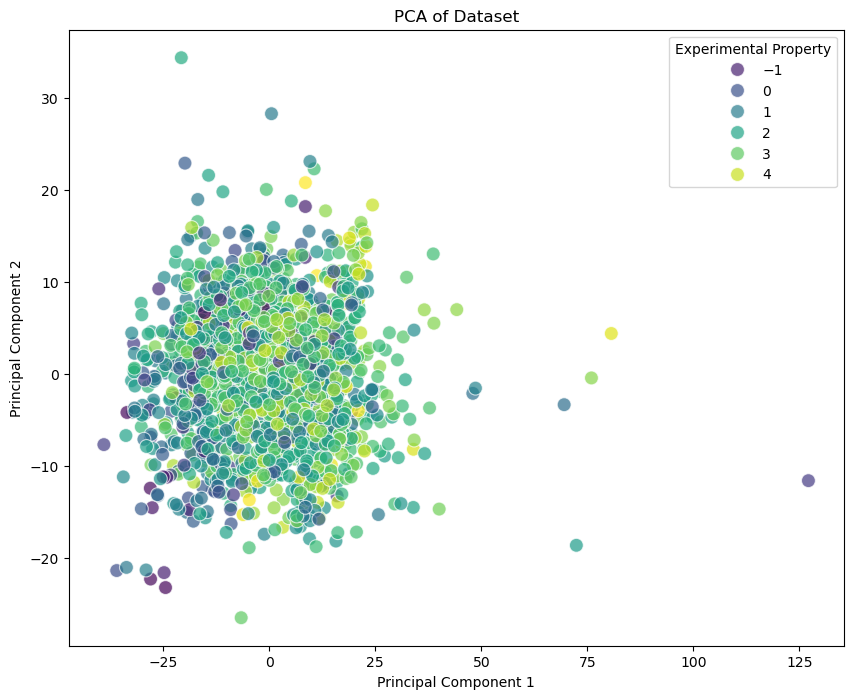

In [27]:
X = df.drop('experimental_proprty', axis=1)
y = df.experimental_proprty
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)
pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
pca_df['experimental_proprty'] = y.values
plt.figure(figsize=(10, 8))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='experimental_proprty', palette='viridis', s=100, alpha=0.7)
plt.title('PCA of Dataset')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Experimental Property')
plt.show()

From this PCA we can see that we aren't able to accurately visualize the different principal components of the given dataset. So that means we haven't preprocessed the data enough. So lets preprocess the data further to get a more easily distinguishable graphic

Let us first start by dropping all the columns that had strings as the values present inside them. This is because we really can't get to know what these strings actually tell you about the dataset. Let us also only keep floating point values and discard all integer type variables.

In [28]:
df = df.drop(['MS_enc', 'MIF', 'SMIF'], axis=1)

In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Columns: 549 entries, experimental_proprty to n6Ring
dtypes: float64(444), int64(105)
memory usage: 8.4 MB


In [30]:
df.head()

,experimental_proprty,nHetero,nX,C2SP3,MPC5,ATS0i,NaasN,SsCH3,nCl,nFAHRing,SlogP_VSA6,AATS3d,ATSC6are,nHBDon,SddssS,ATS6m,nAcid,PEOE_VSA8,SsssCH,ATSC5dv,MPC9,SsBr,MPC4,AATS5v,ZMIC1,C2SP2,ATSC8v,MW2,MIC5,SMR_VSA2,nBondsA,Xp-7d,ATS8Z,nBondsKD,ATS1dv,SaasN,PEOE_VSA6,LabuteASA,AATS5pe,ATS3pe,n9FaRing,SssS,ATS0se,MPC7,AATSC5m,EState_VSA6,SRW04,SRW03,AATS5i,n5HRing,NaaN,AATS1Z,Sse,ATSC3d,AATS5d,VSA_EState1,IC2,SRW10,Xp-3dv,AATS5Z,ATS7pe,ATSC6pe,Xpc-5dv,bpol,ATSC0d,n10FaHRing,CIC1,ATSC1i,AATSC0dv,ATS4pe,ATS0are,nBondsS,ATSC6Z,ATS0v,ATS2d,ATS8pe,nF,ATS5i,ATS4m,ATS1se,MWC07,EState_VSA2,ATSC4d,ATSC3i,ATSC4p,Xp-6d,piPC5,ATS1are,AATS4m,IC4,NaaNH,WPol,NsCl,ATS0m,ATSC1pe,VSA_EState9,SdNH,AATSC0Z,ATS0pe,AATSC5Z,nBondsKS,SMR_VSA9,ATS3m,nBonds,ATSC8dv,MIF4,VSA_EState4,PEOE_VSA13,Xp-3d,ATS2se,SlogP_VSA10,ATSC6v,ATSC2i,ATS2are,n6aRing,AATS2Z,PEOE_VSA11,MWC03,AATSC3m,nFRing,TIC3,nO,ATSC7pe,ATS4v,AATSC1v,SRW05,EState_VSA8,Xpc-5d,NssssC,Sv,SRW06,ATSC4m,AATSC5dv,C1SP3,ATS8m,ATSC4Z,Sp,SdO,nHRing,ABCGG,NtsC,ATS1m,EState_VSA9,AATSC5v,nH,ATS7m,IC3,ATSC5se,ATS4d,AATSC4m,TIC5,ATS1p,MPC6,SlogP_VSA11,Diameter,GGI1,Xp-0dv,AATS2i,VMcGowan,ATSC3v,AATS0m,ATS1pe,ATS7are,ATS0Z,EState_VSA4,NaaaC,MWC05,n10FHRing,ATSC7p,AATS3Z,ATSC7se,TIC0,CIC2,ATSC0pe,VSA_EState5,SssO,ATS7dv,SaaO,SRW07,ATS5m,ATSC2Z,ATSC4dv,n9FHRing,AATSC4dv,n5aRing,SlogP_VSA1,MIF6,VSA_EState3,Xp-2dv,MIC4,Xp-4dv,fragCpx,TSRW10,GGI2,SRW08,piPC9,NssCH2,SZ,ATS7i,Si,ATSC4are,Zagreb1,ATSC3pe,SsssN,ATS2Z,NssNH,ATS2pe,ATS5v,AATS1m,ZMIC4,ATSC0p,AATS4d,ATS5pe,ATSC5v,PEOE_VSA5,AATS3m,mZagreb2,AATSC1m,n5Ring,ATSC1m,MIC1,ATSC8m,SMR_VSA4,AATSC2Z,n10FaRing,ATSC3Z,SdssC,SlogP_VSA7,EState_VSA1,AATS4i,SRW09,ATSC4i,ATSC1Z,Xpc-6d,AATS3i,ATS3v,VSA_EState8,ATS8se,ATSC2p,EState_VSA3,GGI4,ATSC1dv,ATS3se,ATSC8p,ATS8v,AATSC4v,ATSC6dv,ATSC5Z,SssNH,MWC06,nHeavyAtom,ATS6are,ATS3p,ECIndex,Xp-5d,MWC10,StsC,AATSC1Z,SMR_VSA3,piPC8,FilterItLogS,nBase,ATSC8se,nC,GGI3,TopoPSA(NO),ATSC5pe,NssO,ATS8d,piPC3,nRing,NsNH2,AATS3v,Kier3,ZMIC3,AATSC0m,ATSC8are,SlogP_VSA2,SMR_VSA5,AATS1dv,Xpc-4dv,n5aHRing,NsssN,Kier2,ATS4p,NaaS,AATS4Z,MIF2,ATS6se,ATS1v,MPC2,SMR_VSA7,SaaNH,SaaCH,AATSC3v,ATSC5are,ATS2v,AATSC4Z,ZMIC2,ATS5are,ATS6d,ATS7v,ATSC6i,ATSC2d,SlogP_VSA8,PEOE_VSA1,nN,ATS3d,VSA_EState6,ATSC4v,IC5,SsOH,nHBAcc,AATS4are,piPC6,SsF,MW,ATS4are,ATSC3p,NdO,n5AHRing,BertzCT,AATS1d,nAromBond,TMWC10,ATS8are,n9FaHRing,ATS8dv,Xp-1dv,SdsN,nBridgehead,AATS2d,AATS4v,naRing,ATSC1d,ATS2p,ATSC1v,ATSC0dv,AATSC3dv,NddssS,ATS7Z,ATS6i,TIC4,AATSC3Z,ATS1i,Sm,VAdjMat,ATS7se,AATS0v,nAHRing,SlogP_VSA5,Xc-3dv,AATS3dv,GGI6,ATS2m,ATSC7d,ATSC7dv,NsCH3,n5ARing,ATSC8pe,NsF,BalabanJ,PEOE_VSA2,naHRing,MIF3,ATS4i,ATSC2dv,AATS4dv,nFaRing,SMR,AMW,ATS8i,CIC0,nFaHRing,ABC,AATS2m,ATS6dv,MIC2,ATSC7are,ATS8p,TopoPSA,ATSC5i,Xp-1d,MWC01,Kier1,AATSC0i,ATSC3se,Xp-5dv,Sare,ATSC6m,ZMIC5,AATS1i,nAromAtom,PEOE_VSA3,ATSC0Z,ZMIC0,ATS5Z,Xc-3d,ATS3Z,MIF5,SssCH2,n6aHRing,ATSC0i,MWC08,n10FRing,SaaS,Spe,ATS0dv,Zagreb2,SlogP_VSA3,NdsCH,MWC09,ATSC1p,ATSC6p,ATSC3m,NaasC,ATS4Z,ATS0p,Radius,n6HRing,nARing,PEOE_VSA9,piPC10,ATSC2m,SssssC,NaaCH,C3SP3,EState_VSA7,ATS3dv,MPC3,ATS5p,SLogP,ATSC0se,ATSC7Z,n6AHRing,SaaaC,ATS5d,MIC0,PEOE_VSA7,nRot,StCH,ATSC2v,EState_VSA10,AATS0are,ATSC7m,AATS0i,ATS7p,nBondsD,nFHRing,ATSC1are,SMR_VSA1,TIC1,Xp-4d,nAtom,ATSC3dv,C3SP2,ATS6Z,n6ARing,MPC8,ATSC4se,NsOH,Xpc-4d,SsNH2,ATSC0v,SMR_VSA6,piPC7,Xp-6dv,PEOE_VSA4,ATS6p,apol,ATSC2se,AATSC0v,ATSC3are,StN,ATS1d,ATS2i,ATSC4pe,ATSC5p,ATS2dv,AATS5m,nS,piPC4,ATSC5m,ATS7d,AATS1v,AATS0pe,AATS2dv,VSA_EState2,ATSC0m,ATS3are,ATSC8Z,ATS3i,ATS1Z,ATSC7v,ATSC8i,ATSC5d,PEOE_VSA10,ATSC7i,Xp-2d,AATS0dv,nBondsO,AATS5dv,TIC2,GGI5,AATSC2dv,TMPC10,AATSC2m,MWC04,n9FRing,Xc-5d,ATSC8d,MIC3,VSA_EState7,NdssC,TpiPC10,C1SP2,nBondsM,SaasC,WPath,ATS6pe,ATSC2are,AATS5are,ATS4dv,SlogP_VSA4,SdsCH,MPC10,ATSC6d,ATS5dv,ATS5se,NsssCH,ATSC6se,AATSC2v,PEOE_VSA12,IC1,SaaN,ATS4se,Xpc-6dv,EState_VSA5,ATS0d,AATS0Z,ATSC0are,ATSC2pe,SsCl,ATS6v,AATSC1dv,nFARing,AATS2v,Xp-7dv,n6Ring
0,3.54,5,1,0,83,7305.483137,1,2.105782,1,0,48.530937,3.127273,-0.059812,0,0.000000,4833.658505,

In [31]:
int_columns = df.select_dtypes(include='int64').columns

In [32]:
int_columns

Index(['nHetero', 'nX', 'C2SP3', 'MPC5', 'NaasN', 'nCl', 'nFAHRing', 'nHBDon',
       'nAcid', 'MPC9',
       ...
       'TMPC10', 'n9FRing', 'NdssC', 'C1SP2', 'nBondsM', 'WPath', 'MPC10',
       'NsssCH', 'nFARing', 'n6Ring'],
      dtype='object', length=105)

In [33]:
df = df.drop(int_columns, axis=1)

In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Columns: 444 entries, experimental_proprty to Xp-7dv
dtypes: float64(444)
memory usage: 6.8 MB


In [35]:
a = df.nunique()>10
a

experimental_proprty     True
ATS0i                    True
SsCH3                    True
SlogP_VSA6               True
AATS3d                   True
ATSC6are                 True
SddssS                   True
ATS6m                    True
PEOE_VSA8                True
SsssCH                   True
ATSC5dv                  True
SsBr                     True
AATS5v                   True
ZMIC1                    True
ATSC8v                   True
MW2                      True
MIC5                     True
SMR_VSA2                False
Xp-7d                    True
ATS8Z                    True
ATS1dv                   True
SaasN                    True
PEOE_VSA6                True
LabuteASA                True
AATS5pe                  True
ATS3pe                   True
SssS                     True
ATS0se                   True
AATSC5m                  True
EState_VSA6              True
SRW04                    True
SRW03                   False
AATS5i                   True
AATS1Z    

In [36]:
df = df.drop(["SMR_VSA2", "SRW03", "MIF4", "StCH"], axis = 1)

<Axes: >

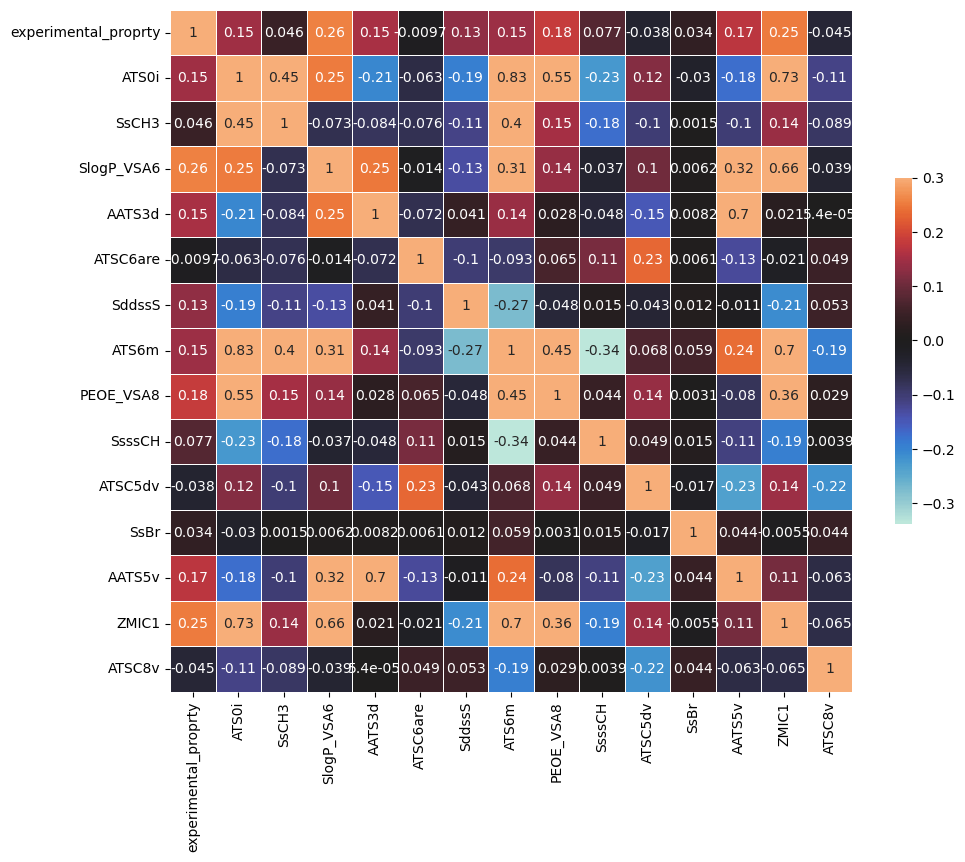

In [37]:
# Compute the correlation matrix
corr = df.iloc[:, :15].corr()

# Generate a mask for the upper triangle

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(130, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(df.iloc[:, :15].corr(), vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot = True)

In [38]:
corr = df.corr()

In [39]:
corr.to_csv('Corr1.csv')
a = {"Column1": list(), "Column2": list(), "Correlation value": list()}
for i in list(corr.columns):
    for j in range(list(corr.columns).index(i)+1, len(corr[i])):
        if corr[i][j]>0.9:
            a["Column1"].append(i)
            a["Column2"].append(corr.columns[j])
            a["Correlation value"].append(corr[i][j])

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_16724\900541120.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  if corr[i][j]>0.9:
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_16724\900541120.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  a["Correlation value"].append(corr[i][j])


In [40]:
reps = {"Column_name":[], "number_of_times":[]}
for k in a['Column1']:
    if k not in reps["Column_name"]:
        reps["Column_name"].append(k)
        reps["number_of_times"].append(a["Column1"].count(k))

In [41]:
df = df.drop("SsBr", axis = 1)

In [42]:
ind = []
for i in range(len(reps["number_of_times"])):
    if reps['number_of_times'][i]>40:
        ind.append(reps['Column_name'][i])
df = df.drop(ind, axis=1)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Columns: 379 entries, experimental_proprty to Xp-7dv
dtypes: float64(379)
memory usage: 5.8 MB


<Axes: >

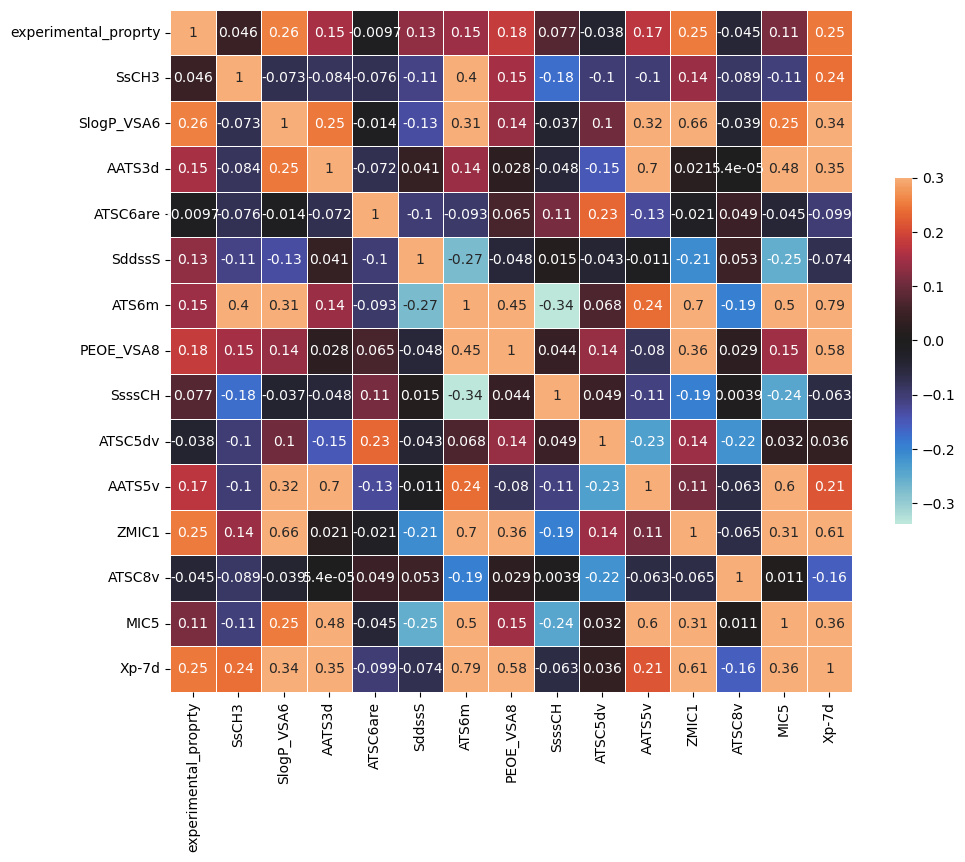

In [43]:
# Compute the correlation matrix
corr = df.iloc[:, :15].corr()

# Generate a mask for the upper triangle

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(130, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(df.iloc[:, :15].corr(), vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot = True)

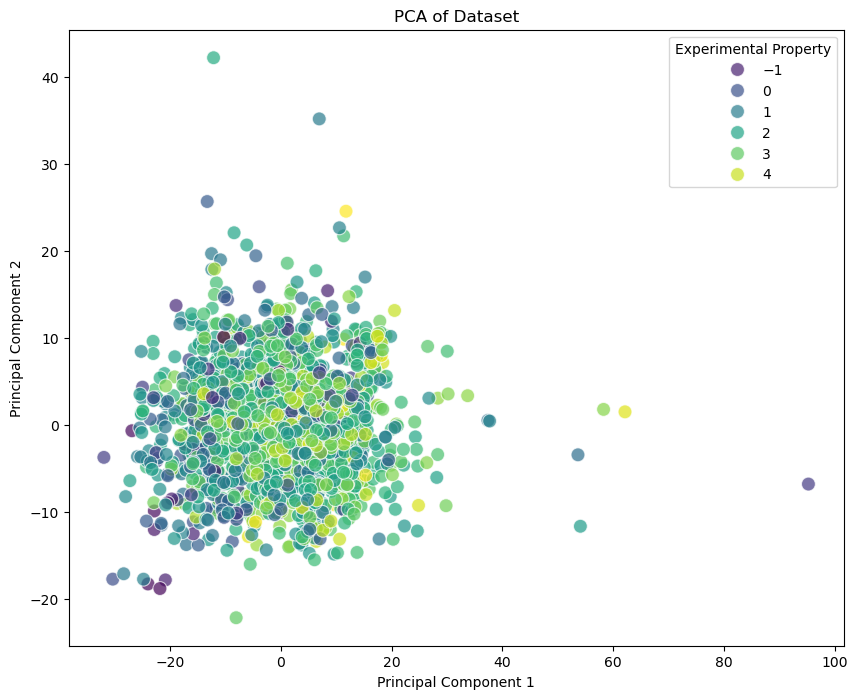

In [44]:
X = df.drop('experimental_proprty', axis=1)
y = df.experimental_proprty
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)
pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
pca_df['experimental_proprty'] = y.values
plt.figure(figsize=(10, 8))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='experimental_proprty', palette='viridis', s=100, alpha=0.7)
plt.title('PCA of Dataset')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Experimental Property')
plt.show()

In [45]:
z = np.abs(stats.zscore(df))
df = df[(z<4).all(axis=1)]
df.shape

(1474, 379)

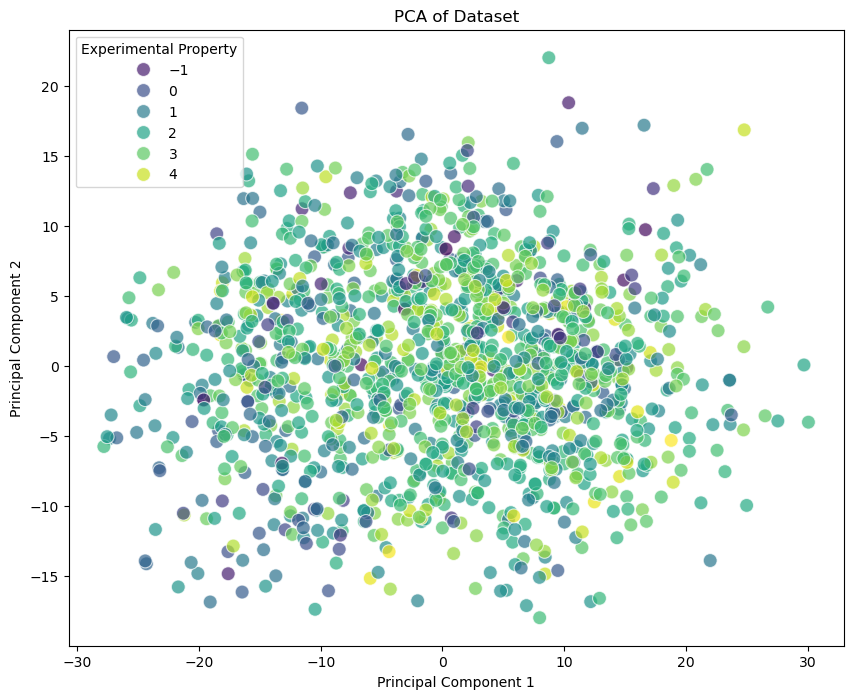

In [46]:
X = df.drop('experimental_proprty', axis=1)
y = df.experimental_proprty
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)
pca_df = pd.DataFrame(X_pca, columns=['PC1', 'PC2'])
pca_df['experimental_proprty'] = y.values
plt.figure(figsize=(10, 8))
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='experimental_proprty', palette='viridis', s=100, alpha=0.7)
plt.title('PCA of Dataset')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Experimental Property')
plt.show()